# Week7 - Tree Assignment

- Load the breast cancer dataset using datasets.load_breast_cancer()
- Use scatter plots to look at the data (use different colors for the classes)
- Use box plots to look at the data 
- create a training and test set with random_state = 3
- train a decision tree model on the training set.
- train a logistic regression model on the training set
- train a random forest model on the training set
- Which model performed better?
- Which features were most relevant in each model (a part from random forest)?
- Use grid search to improve performance on the best performed model

In [63]:

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Load the breast cancer dataset
data = load_breast_cancer()




In [ ]:
# Scatter plot the data
colors = ['red', 'blue']
for i in range(data.data.shape[1]):
    for j in range(data.data.shape[1]):
        if i == j:
            continue
        plt.scatter(data.data[:,i], data.data[:,j], c=data.target, cmap=plt.cm.brg, edgecolor='k')
        plt.xlabel(data.feature_names[i])
        plt.ylabel(data.feature_names[j])
        plt.show()

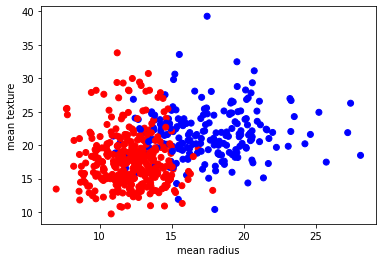

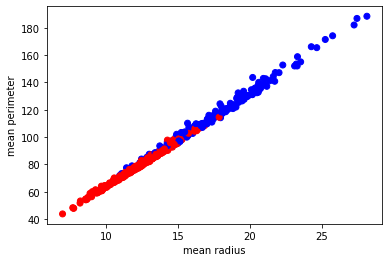

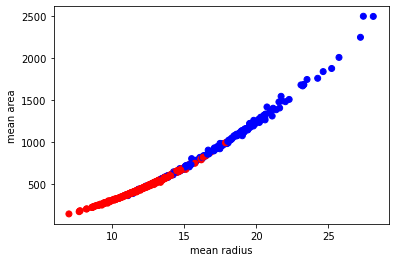

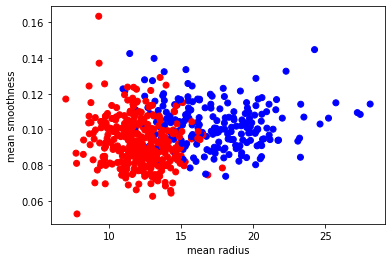

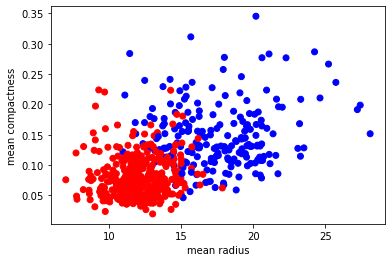

...

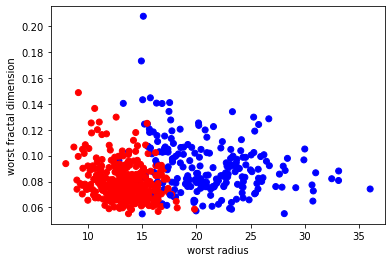

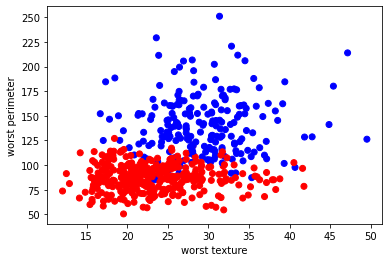

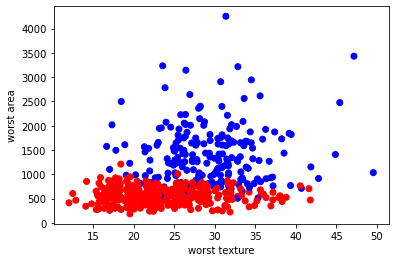

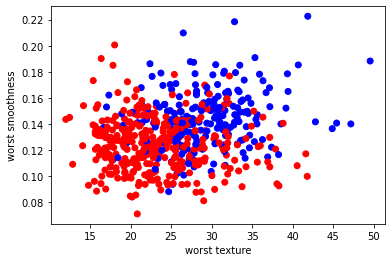

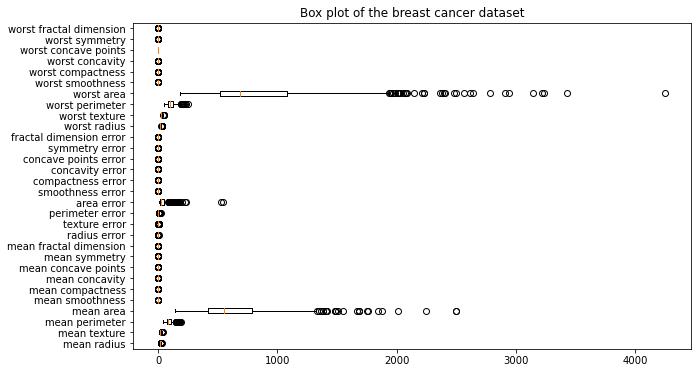

In [70]:
# Box plot the data
fig, ax = plt.subplots(figsize=(10,6))
ax.boxplot(data.data, vert=False, labels=data.feature_names)
ax.set_title('Box plot of the breast cancer dataset')
plt.show()

In [71]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=3)


In [72]:
# Train a decision tree model
dt = DecisionTreeClassifier(random_state=3)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
acc_dt = accuracy_score(y_test, y_pred_dt)
print('Decision tree accuracy: {:.2f}%'.format(acc_dt*100))

Decision tree accuracy: 89.47%


In [73]:
# Train a logistic regression model
log_reg = LogisticRegression(random_state=3)
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
acc_log_reg = accuracy_score(y_test, y_pred_log_reg)
print('Logistic regression accuracy: {:.2f}%'.format(acc_log_reg*100))


Logistic regression accuracy: 91.23%


/Users/dharanireddy/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [74]:
# Train a random forest model
rf = RandomForestClassifier(random_state=3)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
acc_rf = accuracy_score(y_test, y_pred_rf)
print('Random forest accuracy: {:.2f}%'.format(acc_rf*100))

Random forest accuracy: 93.86%


In [75]:
# Print the feature importances for the decision tree and random forest models
print('Decision tree feature importances:')
for i in np.argsort(dt.feature_importances_)[::-1]:
    print('{}: {:.3f}'.format(data.feature_names[i], dt.feature_importances_[i]))

Decision tree feature importances:
worst concave points: 0.708
worst area: 0.157
mean texture: 0.035
area error: 0.028
worst concavity: 0.018
worst smoothness: 0.012
texture error: 0.009
worst perimeter: 0.009
mean smoothness: 0.008
worst symmetry: 0.008
symmetry error: 0.005
mean concavity: 0.004
worst texture: 0.001
worst fractal dimension: 0.000
mean concave points: 0.000
mean area: 0.000
mean compactness: 0.000
mean fractal dimension: 0.000
mean perimeter: 0.000
mean symmetry: 0.000
smoothness error: 0.000
radius error: 0.000
perimeter error: 0.000
compactness error: 0.000
concavity error: 0.000
concave points error: 0.000
fractal dimension error: 0.000
worst radius: 0.000
worst compactness: 0.000
mean radius: 0.000


In [76]:
print('\nRandom forest feature importances:')
for i in np.argsort(rf.feature_importances_)[::-1]:
    print('{}: {:.3f}'.format(data.feature_names[i], rf.feature_importances_[i]))



Random forest feature importances:
worst perimeter: 0.177
worst concave points: 0.153
worst radius: 0.124
mean concave points: 0.097
worst area: 0.096
mean area: 0.046
mean radius: 0.040
mean concavity: 0.034
worst concavity: 0.030
mean perimeter: 0.026
area error: 0.021
worst compactness: 0.021
worst texture: 0.017
perimeter error: 0.016
worst smoothness: 0.013
mean compactness: 0.013
radius error: 0.012
mean texture: 0.009
concavity error: 0.008
worst symmetry: 0.007
texture error: 0.006
mean smoothness: 0.006
worst fractal dimension: 0.005
symmetry error: 0.004
compactness error: 0.004
smoothness error: 0.004
fractal dimension error: 0.003
mean symmetry: 0.003
mean fractal dimension: 0.003
concave points error: 0.002


In [87]:
# Use grid search to optimize the random forest model
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(rf, param_grid, cv=5)
grid_search.fit(X_train, y_train)
y_pred_rf_gs = grid_search.predict(X_test)
acc_rf_gs = accuracy_score(y_test, y_pred_rf_gs)
print('\nRandom')


Random
